<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>

<span class="highlight">
  <b>NUCLIO DIGITAL SCHOOL -</b> MASTER EN DATA SCIENCE
</span>
<span class="highlight">
  TRABAJO FIN DE MASTER - <b>SERIES TEMPORALES</b>
</span>

<br>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 45px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b> TAREA 3: PREDICCIÓN DE VENTAS
 </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

* ## __Hasta ahora, siempre hemos ido prediciendo las ventas a nivel de tienda-producto, y para obtener ventas agregadas por departamento/tienda/ciudad sumamos las predicciones independientes. ¿Seguiría siendo un enfoque válido?.__

* ## __Puedes empezar con predicciones de 28 días (4 semanas).__

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 45px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>1. INTRODUCCIÓN Y PREPROCESAMIENTO: ANÁLISIS DESCRIPTIVO </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [1]:
import pandas as pd
import plotly.express as px
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error , mean_absolute_percentage_error, root_mean_squared_error
from sklearn.model_selection import GridSearchCV
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import numpy as np
import holidays
from prophet import Prophet
import xgboost as xgb
from PIL import Image
import warnings
import plotly.graph_objects as go

warnings.filterwarnings('ignore')
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.set_option('display.max_columns',100)
pd.set_option('display.width',100)
pd.set_option('display.max_colwidth',100)

#### FUNCIÓN PARA CAMBIAR EL NÚMERO MÁXIMO DE LÍNEAS EN LOS PRINT ####
def cambia_salida(flag):
    if not flag:
        pd.set_option('display.max_rows',None)
    else:
        pd.set_option('display.max_rows',flag)

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>1.2. LEEMOS EL DATASET DE VENTAS </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [2]:
df = pd.read_csv("Ventas por departamento y tienda.csv")
df.rename(columns={"sum(v.unidades)": "unidades", "sum(v.cifra)" : "cifra", "max(t.region)": "region","max(t.store)": "store","max(t.latitud)": "latitud","max(t.longitud)": "longitud" }, inplace=True)
df['fecha'] = pd.to_datetime(df['fecha'], format = '%Y-%m-%d')
df.info()
df_articulos = df.groupby('department')['cifra'].sum().reset_index().sort_values(by='cifra', ascending=False)
df_articulos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 133547 entries, 0 to 133546
Data columns (total 13 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   fecha       133547 non-null  datetime64[ns]
 1   ejercicio   133547 non-null  int64         
 2   mes         133547 non-null  int64         
 3   semana      133547 non-null  int64         
 4   store_code  133547 non-null  object        
 5   category    133547 non-null  object        
 6   department  133547 non-null  object        
 7   unidades    133547 non-null  float64       
 8   cifra       133547 non-null  float64       
 9   region      133547 non-null  object        
 10  store       133547 non-null  object        
 11  latitud     133547 non-null  float64       
 12  longitud    133547 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(3), object(5)
memory usage: 13.2+ MB


,department,cifra
6,SUPERMARKET_3,85166272.97
2,HOME_&_GARDEN_1,51583559.46
5,SUPERMARKET_2,30025112.19
0,ACCESORIES_1,28787932.77
3,HOME_&_GARDEN_2,18366956.06
4,SUPERMARKET_1,15502613.64
1,ACCESORIES_2,1561468.97


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>1.5. VAMOS ANALIZAR AHORA LA DISTRIBUCIÓN DE VENTAS POR TIENDA </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [3]:
ventas_por_tienda = df.groupby('store').agg(TotalSales=('cifra', 'sum'),
                                            Movimientos=('unidades', 'sum')).reset_index()
ventas_por_tienda.sort_values(by='TotalSales', ascending=False)

,store,TotalSales,Movimientos
8,Tribeca,39493312.02,11188180.00
2,Greenwich_Village,27736571.23,7698216.00
6,Roxbury,25267912.43,7214384.00
0,Back_Bay,21948191.86,6089330.00
9,Yorktown,21659506.56,6544012.00
3,Harlem,21508193.01,5685475.00
5,Queen_Village,20753532.89,6427782.00
7,South_End,19342266.98,5595292.00
4,Midtown_Village,18236426.19,5149062.00
1,Brooklyn,15048002.89,4103676.00


In [4]:
cambia_salida(20)
df['fecha'] = pd.to_datetime(df['fecha'])
ventas_por_fecha_tienda = df.groupby([df['fecha'].dt.date, 'store'])['cifra'].sum().unstack().fillna(0).reset_index()
ventas_por_fecha_tienda.columns.name = None
ventas_por_fecha_tienda['fecha'] = pd.to_datetime(ventas_por_fecha_tienda['fecha'])
ventas_por_fecha_tienda

,fecha,Back_Bay,Brooklyn,Greenwich_Village,Harlem,Midtown_Village,Queen_Village,Roxbury,South_End,Tribeca,Yorktown
0,2011-01-29,9331.27,5604.83,13413.55,11222.22,8019.00,11492.99,12203.88,8097.15,14336.85,6716.58
1,2011-01-30,9028.83,5737.84,11971.81,10385.80,7021.16,12099.23,12070.56,8128.08,14916.24,5706.22
2,2011-01-31,6632.56,4472.59,8847.92,6578.61,4517.85,9242.54,8181.91,5578.07,11203.18,5672.54
3,2011-02-01,6866.44,4565.62,9074.16,6871.80,3646.74,8779.90,8567.87,6575.04,12576.93,7047.48
4,2011-02-02,4980.22,4709.20,8043.59,6467.75,3.55,5649.41,7428.37,5309.10,11726.32,3268.67
...,...,...,...,...,...,...,...,...,...,...,...
1908,2016-04-20,13721.02,9855.64,15223.97,14237.75,12221.15,11450.71,13949.81,11040.97,22388.94,14961.69
1909,2016-04-21,14282.03,10093.89,14404.03,13218.05,12764.61,11321.75,14105.43,10169.71,20012.54,15658.31
1910,2016-04-22,14719.82,10213.23,17514.33,18044.06,15153.46,13464.63,15456.44,11728.10,22835.76,17459.97
1911,2016-04-23,16256.91,12256.83,22633.14,24474.64,17675.32,16131.32,18000.99,14011.78,30732.98,19320.71


In [5]:
# Crear un rango de fechas completo
rango = pd.date_range(start=ventas_por_fecha_tienda['fecha'].min(), end=ventas_por_fecha_tienda['fecha'].max())
ventas_por_fecha_tienda = pd.merge(pd.DataFrame({'fecha': rango}), ventas_por_fecha_tienda, on='fecha', how='left')
ventas_por_fecha_tienda = ventas_por_fecha_tienda.fillna(0)
ventas_por_fecha_tienda.set_index('fecha', inplace=True)
ventas_por_fecha_tienda['Total Tiendas'] = ventas_por_fecha_tienda.iloc[:, 0:].sum(axis=1)
ventas_por_fecha_tienda

,Back_Bay,Brooklyn,Greenwich_Village,Harlem,Midtown_Village,Queen_Village,Roxbury,South_End,Tribeca,Yorktown,Total Tiendas
fecha,,,,,,,,,,,
2011-01-29,9331.27,5604.83,13413.55,11222.22,8019.00,11492.99,12203.88,8097.15,14336.85,6716.58,100438.32
2011-01-30,9028.83,5737.84,11971.81,10385.80,7021.16,12099.23,12070.56,8128.08,14916.24,5706.22,97065.77
2011-01-31,6632.56,4472.59,8847.92,6578.61,4517.85,9242.54,8181.91,5578.07,11203.18,5672.54,70927.77
2011-02-01,6866.44,4565.62,9074.16,6871.80,3646.74,8779.90,8567.87,6575.04,12576.93,7047.48,74571.98
2011-02-02,4980.22,4709.20,8043.59,6467.75,3.55,5649.41,7428.37,5309.10,11726.32,3268.67,57586.18
...,...,...,...,...,...,...,...,...,...,...,...
2016-04-20,13721.02,9855.64,15223.97,14237.75,12221.15,11450.71,13949.81,11040.97,22388.94,14961.69,139051.65
2016-04-21,14282.03,10093.89,14404.03,13218.05,12764.61,11321.75,14105.43,10169.71,20012.54,15658.31,136030.35
2016-04-22,14719.82,10213.23,17514.33,18044.06,15153.46,13464.63,15456.44,11728.10,22835.76,17459.97,156589.80


In [6]:
uds_por_fecha_tienda = df.groupby([df['fecha'].dt.date, 'store'])['cifra'].sum().unstack().fillna(0).reset_index()
uds_por_fecha_tienda.columns.name = None
uds_por_fecha_tienda['fecha'] = pd.to_datetime(uds_por_fecha_tienda['fecha'])
uds_por_fecha_tienda

,fecha,Back_Bay,Brooklyn,Greenwich_Village,Harlem,Midtown_Village,Queen_Village,Roxbury,South_End,Tribeca,Yorktown
0,2011-01-29,9331.27,5604.83,13413.55,11222.22,8019.00,11492.99,12203.88,8097.15,14336.85,6716.58
1,2011-01-30,9028.83,5737.84,11971.81,10385.80,7021.16,12099.23,12070.56,8128.08,14916.24,5706.22
2,2011-01-31,6632.56,4472.59,8847.92,6578.61,4517.85,9242.54,8181.91,5578.07,11203.18,5672.54
3,2011-02-01,6866.44,4565.62,9074.16,6871.80,3646.74,8779.90,8567.87,6575.04,12576.93,7047.48
4,2011-02-02,4980.22,4709.20,8043.59,6467.75,3.55,5649.41,7428.37,5309.10,11726.32,3268.67
...,...,...,...,...,...,...,...,...,...,...,...
1908,2016-04-20,13721.02,9855.64,15223.97,14237.75,12221.15,11450.71,13949.81,11040.97,22388.94,14961.69
1909,2016-04-21,14282.03,10093.89,14404.03,13218.05,12764.61,11321.75,14105.43,10169.71,20012.54,15658.31
1910,2016-04-22,14719.82,10213.23,17514.33,18044.06,15153.46,13464.63,15456.44,11728.10,22835.76,17459.97
1911,2016-04-23,16256.91,12256.83,22633.14,24474.64,17675.32,16131.32,18000.99,14011.78,30732.98,19320.71


In [7]:
# Crear un rango de fechas completo
rango = pd.date_range(start=uds_por_fecha_tienda['fecha'].min(), end=uds_por_fecha_tienda['fecha'].max())
uds_por_fecha_tienda = pd.merge(pd.DataFrame({'fecha': rango}), uds_por_fecha_tienda, on='fecha', how='left')
uds_por_fecha_tienda = uds_por_fecha_tienda.fillna(0)
uds_por_fecha_tienda.set_index('fecha', inplace=True)
uds_por_fecha_tienda['Total Tiendas'] = uds_por_fecha_tienda.iloc[:, 0:].sum(axis=1)
uds_por_fecha_tienda

,Back_Bay,Brooklyn,Greenwich_Village,Harlem,Midtown_Village,Queen_Village,Roxbury,South_End,Tribeca,Yorktown,Total Tiendas
fecha,,,,,,,,,,,
2011-01-29,9331.27,5604.83,13413.55,11222.22,8019.00,11492.99,12203.88,8097.15,14336.85,6716.58,100438.32
2011-01-30,9028.83,5737.84,11971.81,10385.80,7021.16,12099.23,12070.56,8128.08,14916.24,5706.22,97065.77
2011-01-31,6632.56,4472.59,8847.92,6578.61,4517.85,9242.54,8181.91,5578.07,11203.18,5672.54,70927.77
2011-02-01,6866.44,4565.62,9074.16,6871.80,3646.74,8779.90,8567.87,6575.04,12576.93,7047.48,74571.98
2011-02-02,4980.22,4709.20,8043.59,6467.75,3.55,5649.41,7428.37,5309.10,11726.32,3268.67,57586.18
...,...,...,...,...,...,...,...,...,...,...,...
2016-04-20,13721.02,9855.64,15223.97,14237.75,12221.15,11450.71,13949.81,11040.97,22388.94,14961.69,139051.65
2016-04-21,14282.03,10093.89,14404.03,13218.05,12764.61,11321.75,14105.43,10169.71,20012.54,15658.31,136030.35
2016-04-22,14719.82,10213.23,17514.33,18044.06,15153.46,13464.63,15456.44,11728.10,22835.76,17459.97,156589.80


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>1.5.1. Primer vistazo de todas las series de todas las tiendas en el mismo gráfico. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [8]:
ventas_por_fecha_tienda

,Back_Bay,Brooklyn,Greenwich_Village,Harlem,Midtown_Village,Queen_Village,Roxbury,South_End,Tribeca,Yorktown,Total Tiendas
fecha,,,,,,,,,,,
2011-01-29,9331.27,5604.83,13413.55,11222.22,8019.00,11492.99,12203.88,8097.15,14336.85,6716.58,100438.32
2011-01-30,9028.83,5737.84,11971.81,10385.80,7021.16,12099.23,12070.56,8128.08,14916.24,5706.22,97065.77
2011-01-31,6632.56,4472.59,8847.92,6578.61,4517.85,9242.54,8181.91,5578.07,11203.18,5672.54,70927.77
2011-02-01,6866.44,4565.62,9074.16,6871.80,3646.74,8779.90,8567.87,6575.04,12576.93,7047.48,74571.98
2011-02-02,4980.22,4709.20,8043.59,6467.75,3.55,5649.41,7428.37,5309.10,11726.32,3268.67,57586.18
...,...,...,...,...,...,...,...,...,...,...,...
2016-04-20,13721.02,9855.64,15223.97,14237.75,12221.15,11450.71,13949.81,11040.97,22388.94,14961.69,139051.65
2016-04-21,14282.03,10093.89,14404.03,13218.05,12764.61,11321.75,14105.43,10169.71,20012.54,15658.31,136030.35
2016-04-22,14719.82,10213.23,17514.33,18044.06,15153.46,13464.63,15456.44,11728.10,22835.76,17459.97,156589.80


In [9]:
fig = go.Figure()

for tienda in ventas_por_fecha_tienda.columns:
    fig.add_trace(go.Scatter(x=ventas_por_fecha_tienda.index, y=ventas_por_fecha_tienda[tienda], mode='lines', name=tienda))

fig.update_layout(
    title='Serie Temporal con todos los tiendas',
    xaxis_title='Fecha',
    yaxis_title='Total de Ventas',
    legend_title='Tienda',
    template='plotly_white'
)
fig.show()

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>1.5.3. Exploración de los días sin Venta por Tienda. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [10]:
print (f"Total días en el periodo {len(ventas_por_fecha_tienda)}")
dias_sin_venta = (ventas_por_fecha_tienda == 0).sum()
dias_sin_venta.sort_values()

Total días en el periodo 1913


Back_Bay             0
Harlem               0
Total Tiendas        0
Tribeca              1
Queen_Village        2
Yorktown             2
Midtown_Village      3
Roxbury              3
South_End            3
Brooklyn             5
Greenwich_Village    5
dtype: int64

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>1.5.5. VISUALIZACIÓN SEPARADA DE LAS SERIES TEMPORALES DE CADA TIENDA. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [11]:

# Número de filas y columnas
columnas = 6
filas = -(-len(ventas_por_fecha_tienda.columns) // columnas)  # División entera hacia arriba
fig = make_subplots(rows=filas, cols=columnas, subplot_titles=ventas_por_fecha_tienda.columns)
for i, tienda in enumerate(ventas_por_fecha_tienda.columns):
    row = i // columnas + 1
    col = i % columnas + 1
    fig.add_trace(go.Scatter(x=ventas_por_fecha_tienda.index, y=ventas_por_fecha_tienda[tienda], mode='lines', name=tienda, showlegend=False), row=row, col=col)
    
fig.update_layout(height=400*filas, width=3000, title_text="Ventas por Tienda Serie Completa", title_x=0.5, title_font=dict(size=50, family='Arial', color='black'))
fig.show()


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>1.5.6. DESCOMPOSICIÓN DE LAS SERIES TEMPORALES. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [12]:
num_paises = len(ventas_por_fecha_tienda.columns)
fig = make_subplots(rows=num_paises, cols=4, subplot_titles=[f"{pais} - {component}" for pais in ventas_por_fecha_tienda.columns for component in ["Observado", "Tendencia", "Estacional", "Residual"]])

for i, pais in enumerate(ventas_por_fecha_tienda.columns):
    # Realizar la descomposición estacional
    result = seasonal_decompose(ventas_por_fecha_tienda[pais].dropna(), model='additive')

    # Graficar la serie original, la tendencia, la estacionalidad y los residuos
    fig.add_trace(go.Scatter(x=result.observed.index, y=result.observed), row=i+1, col=1)
    fig.add_trace(go.Scatter(x=result.trend.index, y=result.trend), row=i+1, col=2)
    fig.add_trace(go.Scatter(x=result.seasonal[result.seasonal.index.year.isin([2016])].index, y=result.seasonal[result.seasonal.index.year.isin([2016])]), row=i+1, col=3)
    fig.add_trace(go.Scatter(x=result.resid.index, y=result.resid), row=i+1, col=4)
    #fig.add_layout_image(dict( source=banderas[pais], xref="paper", yref="paper", x=-0.04, y=1.025 - (i / num_paises * 1.045), sizex=0.06, sizey=0.02, xanchor="left", yanchor="top"))

# Ajuste del diseño
fig.update_layout(height=400*filas, width=1500, title_text="Descomposición Serie Temporal por Tienda", title_x=0.5, title_font=dict(size=60, family='Arial', color='black'), showlegend=False )
fig.show()


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>1.5.7. VAMOS A DETERMINAR SI LAS SERIES TEMPORALES SON O NO SON ESTACIONARIAS. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

### __Para ello utilizaremos las pruebas de Dickey-Fuller aumentada (ADF) y la prueba de KPSS (Kwiatkowski-Phillips-Schmidt-Shin).__
* #### __Vamos a meter en un dataframe los resultados de aplicar los test `ADF` y `KPSS`, para posteriormente analizar el resultado__
* #### __He creado una columna `warning_kpss` porque previamente había observado un `InterpolationWarning` que puede ser importante a la hora de interpretar los datos__

In [13]:
import pandas as pd
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.stattools import InterpolationWarning
import warnings

# Inicializar listas para almacenar los resultados
paises = []
adf_vals = []
adf_pvals = []
kpss_vals = []
kpss_pvals = []
warnings_kpss = []

for pais in ventas_por_fecha_tienda.columns:
    resultado_adf = adfuller(ventas_por_fecha_tienda[pais])
    # Prueba KPSS
    with warnings.catch_warnings(record=True) as w:
        warnings.simplefilter("always")
        resultado_kpss = kpss(ventas_por_fecha_tienda[pais])
       
        # Verificar si ocurrió una advertencia de interpolación
        if any(issubclass(warning.category, InterpolationWarning) for warning in w):
            print(f'{pais} -> KPSS: Advertencia de interpolación, valor p menor al reportado')
            warnings_kpss.append(True)
        else:
            warnings_kpss.append(False)
    
    # Almacenar los resultados en las listas
    paises.append(pais)
    adf_vals.append(resultado_adf[0])
    adf_pvals.append(resultado_adf[1])
    kpss_vals.append(resultado_kpss[0])
    kpss_pvals.append(resultado_kpss[1])

# Crear el DataFrame a partir de las listas
resultados_df = pd.DataFrame({
    'Pais': paises,
    'ADF': adf_vals,
    'Valor p ADF': adf_pvals,
    'KPSS': kpss_vals,
    'Valor p KPSS': kpss_pvals,
    'Advertencia KPSS': warnings_kpss
})
resultados_df

Back_Bay -> KPSS: Advertencia de interpolación, valor p menor al reportado
Brooklyn -> KPSS: Advertencia de interpolación, valor p menor al reportado
Greenwich_Village -> KPSS: Advertencia de interpolación, valor p menor al reportado
Harlem -> KPSS: Advertencia de interpolación, valor p menor al reportado
Midtown_Village -> KPSS: Advertencia de interpolación, valor p menor al reportado
Queen_Village -> KPSS: Advertencia de interpolación, valor p menor al reportado
Roxbury -> KPSS: Advertencia de interpolación, valor p menor al reportado
South_End -> KPSS: Advertencia de interpolación, valor p menor al reportado
Tribeca -> KPSS: Advertencia de interpolación, valor p menor al reportado
Yorktown -> KPSS: Advertencia de interpolación, valor p menor al reportado
Total Tiendas -> KPSS: Advertencia de interpolación, valor p menor al reportado


,Pais,ADF,Valor p ADF,KPSS,Valor p KPSS,Advertencia KPSS
0,Back_Bay,-0.96,0.77,6.76,0.01,True
1,Brooklyn,-0.99,0.76,6.91,0.01,True
2,Greenwich_Village,-1.45,0.56,9.18,0.01,True
3,Harlem,0.29,0.98,4.98,0.01,True
4,Midtown_Village,-0.97,0.76,7.15,0.01,True
5,Queen_Village,-2.00,0.29,0.82,0.01,True
6,Roxbury,-2.02,0.28,5.58,0.01,True
7,South_End,-1.49,0.54,7.45,0.01,True
8,Tribeca,-1.73,0.41,6.74,0.01,True
9,Yorktown,-0.67,0.85,6.09,0.01,True


### __Interpretación de los resultados__

Según los datos tenemos 3 grupos de resultados

1. Back_Bay:
ADF: El valor p de 0.29 sugiere que no podemos rechazar la hipótesis de no estacionariedad, por lo que no se considera estacionaria según ADF.
KPSS: El valor p de 0.01 y la advertencia True indican que la serie no es estacionaria según KPSS.
Conclusión: La serie de "Back_Bay" no es estacionaria según ambas pruebas.
2. Brooklyn:
ADF: Con un valor p de 0.43, la prueba ADF no rechaza la no estacionariedad, por lo que la serie no parece estacionaria.
KPSS: El valor p de 0.01 y la advertencia True indican no estacionariedad según KPSS.
Conclusión: "Brooklyn" no es estacionaria según ambas pruebas.
3. Harlem:
Ya mencionado antes: Ambos tests ADF y KPSS sugieren no estacionariedad.
4. Midtown_Village:
ADF: El valor p de 0.20 indica que no podemos rechazar la hipótesis de no estacionariedad, por lo que no parece ser estacionaria.
KPSS: El valor p de 0.01 sugiere estacionariedad según KPSS, y la advertencia False confirma que la serie parece estacionaria bajo esta prueba.
Conclusión: Aunque ADF no lo respalda, KPSS indica que "Midtown_Village" podría ser estacionaria.
5. Queen_Village:
ADF: El valor p de 0.33 sugiere que la serie no es estacionaria según la prueba ADF.
KPSS: El valor p de 0.01 con la advertencia True sugiere que tampoco es estacionaria según KPSS.
Conclusión: "Queen_Village" no es estacionaria según ambas pruebas.
6. Roxbury:
ADF: Con un valor p de 0.21, ADF no rechaza la no estacionariedad.
KPSS: Con un valor p de 0.01 y advertencia True, KPSS sugiere que la serie no es estacionaria.
Conclusión: "Roxbury" no es estacionaria según ambas pruebas.
7. South_End:
ADF: El valor p de 0.10 está cerca del umbral de significancia (0.05), pero aún así no podemos rechazar la no estacionariedad con ADF.
KPSS: El valor p de 0.01 y la advertencia True indican que la serie no es estacionaria según KPSS.
Conclusión: "South_End" no es estacionaria.
8. Tribeca:
ADF: El valor p de 0.02 sugiere que la serie es estacionaria según ADF.
KPSS: El valor p de 0.08 y la advertencia False indican que la serie parece ser estacionaria según KPSS.
Conclusión: "Tribeca" es estacionaria según ambas pruebas.
9. Yorktown:
ADF: Con un valor p de 0.09, ADF sugiere cierta posibilidad de estacionariedad, pero no es concluyente.
KPSS: El valor p de 0.01 y la advertencia True sugieren que la serie no es estacionaria según KPSS.
Conclusión: Aunque el ADF muestra que podría haber estacionariedad, KPSS indica que "Yorktown" no es estacionaria.
10. Total Tiendas:
ADF: Con un valor p de 0.27, ADF sugiere que la serie no es estacionaria.
KPSS: Con un valor p de 0.01 y advertencia True, KPSS también indica que la serie no es estacionaria.
Conclusión: "Total Tiendas" no es estacionaria según ambas pruebas.
3. Harlem: Tanto el ADF (valor p ADF = 0.96) como KPSS (valor p KPSS = 0.01 y advertencia KPSS = True) indican que la serie no es estacionaria.

Greenwich_Village: La prueba ADF sugiere que la serie es estacionaria (valor p ADF = 0.00) y la prueba KPSS está de acuerdo (valor p KPSS = 0.01 y advertencia KPSS = False), por lo tanto, es seguro decir que esta serie es estacionaria.
Harlem: Tanto el ADF (valor p ADF = 0.96) como KPSS (valor p KPSS = 0.01 y advertencia KPSS = True) indican que la serie no es estacionaria.

Resumen:
Series Estacionarias (según ambas pruebas):

"Greenwich_Village"
"Tribeca"
Series No Estacionarias (según ambas pruebas):

"Back_Bay"
"Brooklyn"
"Harlem"
"Queen_Village"
"Roxbury"
"South_End"
"Total Tiendas"
Series Inconclusas o con resultados mixtos:

"Midtown_Village" (KPSS sugiere estacionariedad, pero ADF no)
"Yorktown" (ADF sugiere estacionariedad, pero KPSS no)

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>1.5.8. COMPORTAMIENTO DE LA MEDIA MÓVIL EN LOS DISTINTOS PAISES. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [14]:
rows = 3
cols = 4
fig = make_subplots(rows=rows, cols=cols, subplot_titles=paises)
# Añadir cada gráfico a su subplot correspondiente
for i, pais in enumerate(ventas_por_fecha_tienda.columns):
    df = ventas_por_fecha_tienda[[pais]].copy()
    df['Moving_Avg'] = df[pais].rolling(window=7, min_periods=4).mean()

    row = (i // cols) + 1
    col = (i % cols) + 1
    
    fig.add_trace(go.Scatter(x=df.index, y=df[pais], mode='lines', name=f'{pais} Ventas'),row=row, col=col)
    fig.add_trace(go.Scatter(x=df.index, y=df['Moving_Avg'], mode='lines', name=f'{pais} Moving Avg'),row=row, col=col)
    #fig.add_layout_image(dict(source=banderas[pais],xref="paper", yref="paper",x=col/cols - 1/(cols), y=1 - (row-1)/rows + 1/(4*rows), sizex=0.05, sizey=0.05, xanchor="left", yanchor="top"))
    #fig.add_layout_image(dict(source=banderas[pais],xref="x domain", yref="y domain",x=0.2, y=1,sizex=0.2, sizey=0.2,xanchor="right", yanchor="bottom"),row=row, col=col    )

# Ajuste del diseño
fig.update_layout(height=200*filas, width=1500, title_text="Ventas por País con Promedio Móvil", title_x=0.5, title_font=dict(size=60, family='Arial', color='black'), showlegend=False )
fig.show()

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>1.5.10. GRÁFICOS DE AUTOCORRELACIÓN. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

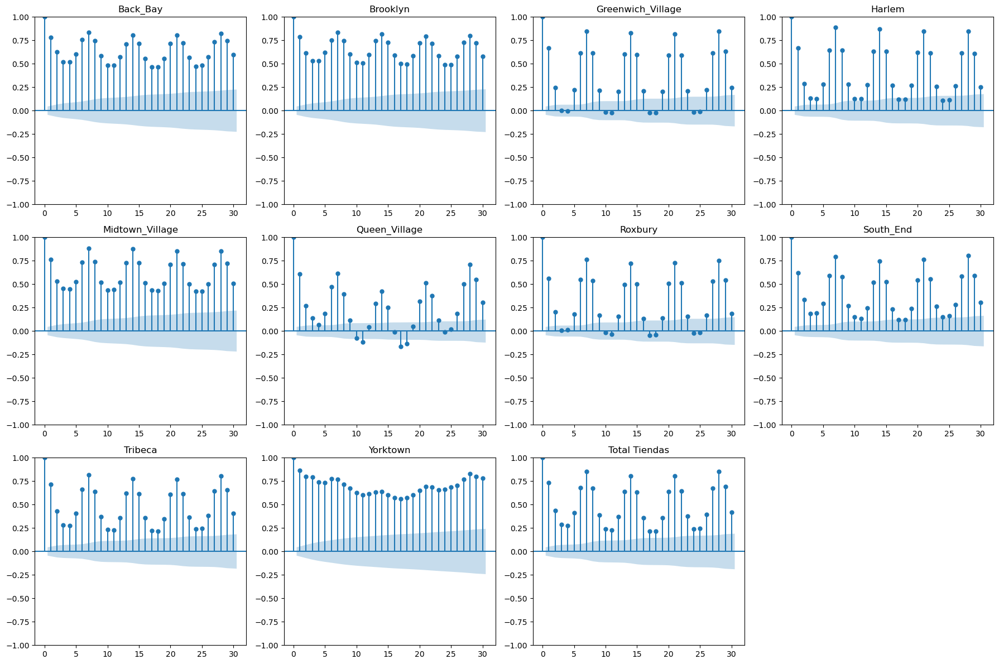

In [15]:
fig, axs = plt.subplots((len(ventas_por_fecha_tienda.columns) + 2) // 4, 4, figsize=(18, 6 * ((len(ventas_por_fecha_tienda.columns) ) // 4)))
axs = axs.flatten()
for i, pais in enumerate(ventas_por_fecha_tienda.columns):
    df = ventas_por_fecha_tienda[[pais]].copy()
    plot_acf(df[pais], lags=30, ax=axs[i], title=f'{pais}')

for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 45px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>2. DESARROLLO DE MÉTODOS </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>2.1. ESTIMACIONES REALIZADAS USANDO DESCOMPOSICIÓN ESTACIONAL. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [16]:
fig = make_subplots(rows=3, cols=4, subplot_titles=ventas_por_fecha_tienda.columns)

for i, pais in enumerate(ventas_por_fecha_tienda.columns):
    row = i // 4 + 1
    col = i % 4 + 1
    
    df = ventas_por_fecha_tienda[[pais]].copy()
    result = seasonal_decompose(df[pais], model='additive', period=30)
    df['Observado'] = result.observed
    df['Tendencia'] = result.trend
    df['Estacionalidad'] = result.seasonal
    df['Residuo'] = result.resid
    df['Estimado'] = df['Tendencia'] + df['Estacionalidad']
    df_matrix = df[[pais, 'Estimado']].dropna()

    fig.add_trace(go.Scatter(x=df_matrix.index, y=df_matrix[pais], mode='lines', name=f'{pais} Observado'), row=row, col=col)
    fig.add_trace(go.Scatter(x=df_matrix.index, y=df_matrix['Estimado'], mode='lines', name=f'{pais} Estimado', line=dict(dash='solid')), row=row, col=col)
    #fig.add_layout_image(dict(source=banderas[pais],xref="x domain", yref="y domain",x=0.2, y=1,sizex=0.2, sizey=0.2,xanchor="right", yanchor="bottom"),row=row, col=col    )

fig.update_layout(height=800, width=1500, title_text="Ventas por País con Estimados", title_x=0.5,showlegend=False, title_font=dict(size=30, family='Arial', color='black'))
fig.show()


### Observaciones Generales:

- En todos los gráficos, la línea estimada sigue de cerca las ventas observadas, lo que sugiere que el modelo de descomposición estacional utilizado (aditivo con un período de 7) es adecuado para capturar la estacionalidad y la tendencia en los datos de ventas.
- Hay grandes diferencias en los picos con los picos estimados, picos que podrían tratarse de eventos aislados.
- Los picos en las ventas observadas son capturados adecuadamente por las estimaciones, indicando que el modelo es efectivo en la mayoría de los casos.

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>Preparo el DataFrame para incluir los EVENTOS. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [17]:
df_eventos = pd.read_csv("daily_calendar_with_events.csv")
df_eventos = df_eventos.dropna(subset=['event'])
df_eventos

,date,weekday,weekday_int,d,event
8,2011-02-06,Sunday,2,d_9,SuperBowl
184,2011-08-01,Monday,3,d_185,Ramadan starts
299,2011-11-24,Thursday,6,d_300,Thanksgiving
337,2012-01-01,Sunday,2,d_338,NewYear
372,2012-02-05,Sunday,2,d_373,SuperBowl
...,...,...,...,...,...
1601,2015-06-18,Thursday,6,d_1602,Ramadan starts
1762,2015-11-26,Thursday,6,d_1763,Thanksgiving
1798,2016-01-01,Friday,7,d_1799,NewYear
1835,2016-02-07,Sunday,2,d_1836,SuperBowl


In [18]:
# CREO UNA COLUMNA PARA INDICAR SI HAY O NO HAY EVENTO
ventas_por_fecha_tienda['evento'] = False
for i, row in df_eventos.iterrows():
    date = row['date']
    if date in ventas_por_fecha_tienda.index:
       ventas_por_fecha_tienda.at[date, 'evento'] = True


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>2.2. ESTIMACIONES CON SARIMAX. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [19]:
##### MODELO ARIMA CONAUTOARIMA DESCARTADO
"""
from pmdarima.preprocessing import FourierFeaturizer
# PREPARO UNA LISTA PARA ALMACENAR LAS MÉTRICAS DE CADA UNO DE LOS tiendaES
lista_metricas_ARIMA = []
predicciones_TOTALES = pd.DataFrame()

for i, tienda in enumerate(ventas_por_fecha_tienda.columns[:-1]):  # Excluir la columna 'evento'
    df = ventas_por_fecha_tienda[[tienda, 'evento']].copy()

    # DIVIDO EL DATASET EN TRAIN Y TEST, HE DECIDIDO RESSERVAR PARA TEST 28 DÍAS QUE ES Y IGUAL A 4 SEMANAS
    train = df.iloc[:-28]
    test = df.iloc[-28:]


    # UTILIZO AUTOARIMA PARA OBTENER LOS PARÁMETROS DE CADA UNO DE LAS TIENDAS
    arima_model = auto_arima(train[tienda], seasonal=True, m=7, exogenous=train[['evento']], trace=False, suppress_warnings=True)
    results_auto_arima = arima_model.fit(train[tienda], exogenous=train[['evento']])

    # PREDICCIÓN DE LOS PRÓXIMOS 28 DÍAS (TEST) 
    forecast_arima = arima_model.predict(n_periods=28, exogenous=test[['evento']])

    # CÁLCULO DE MAE, MSE y RMSE EN TEST
    mae_arima = mean_absolute_error(test[tienda], forecast_arima)
    mse_arima = mean_squared_error(test[tienda], forecast_arima)
    rmse_arima = np.sqrt(mse_arima)
    print(f"{tienda} - MAE ARIMA: {mae_arima}, MSE ARIMA: {mse_arima}, RMSE ARIMA: {rmse_arima}")
    lista_metricas_ARIMA.append({'tienda': tienda, 'MAE': mae_arima, 'MSE': mse_arima, 'RMSE': rmse_arima})


    # PREDICCIÓN DE LOS PRÓXIMOS 30 DÍAS DESPUES DE TEST Y FUERZO A QUE LAS PREDICCIONES DE LOS DOMINGOS Y DIAS FESTIVOS SEAN 0
    # ADEMÁS DESDE EL 24/12/2023 HASTA EL 03/1/2024 AMBOS INCLUSIVE FUERZO UN 0 PARA TODOS LOS tiendaES TAL Y COMO OCURRÍA EL AÑO ANTERIOR.
    arima_model.fit(df[tienda], exogenous=df[['evento']])  # REENTRENO EL MODELO CON TODOS LOS DATOS
    fechas_futuras = pd.date_range(start=df.index[-1] + pd.Timedelta(days=1), periods=28)
    fiestas_futuras = pd.Series(fechas_futuras).apply(lambda x: x in df_eventos['date'].values)
    forecast_28_days = arima_model.predict(n_periods=28, exogenous=fiestas_futuras.to_frame(name='evento'))
    # Crear un DataFrame para almacenar las predicciones de cada tienda
    df_predicciones = pd.DataFrame({
        'Fecha': fechas_futuras,
        'Prediccion_Ventas': forecast_28_days,
        'Tienda': tienda,
        'Modelo': 'ARIMA'
    })
    
    # Almacenar las predicciones en la lista
    predicciones_TOTALES = pd.concat([predicciones_TOTALES,df_predicciones], ignore_index=True)
 
    
    # VISUALIZACIÓN DE PREDICCIONES
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df.index, y=df[tienda], mode='lines', name='Datos históricos'))                                                                  # Agregar datos históricos
    fig.add_trace(go.Scatter(x=pd.date_range(start=df.index[-28], periods=28, freq='D'), y=forecast_arima, mode='lines', name='Predicción ARIMA (28 días)'))  # Agregar predicción de 28 días
    fig.add_trace(go.Scatter(x=pd.date_range(start=df.index[-1], periods=28, freq='D'), y=forecast_28_days, mode='lines', name='Predicción ARIMA (28 días)')) # Agregar predicción de 28 días

    # AÑADO LAS MARCAS DE LOS DÍAS FESTIVOS POR SI AYUDAN A INTERPORETAR EL MODELO
    for _, evento in df_eventos.iterrows():
        evento_date = evento['date']
        evento_name = evento['event']
        fig.add_vline(x=evento_date, line=dict(color="red", width=2, dash="dash"))
        fig.add_annotation(x=evento_date, y=max(df[tienda].max(), max(forecast_28_days)), text=evento_name, showarrow=True, arrowhead=1, textangle=-90, valign="top")
        
    # PONGO LAS BANDERAS EN CADA UNO DE LOS tiendaES
    #fig.add_layout_image(dict(source=banderas[tienda],xref="x domain", yref="y domain",x=-0.010, y=1.2,sizex=0.2, sizey=0.2,xanchor="right", yanchor="bottom"))
    
    # ALGUNOS AJUSTES DE DISEÑO DE LOS GRÁFICOS
    fig.update_layout(
        title= f'{tienda} Predicción ARIMA',
        xaxis_title='Fecha',
        yaxis_title=tienda,
        legend=dict(x=0.4, y=1.4),
        xaxis=dict(
            tickformat='%Y-%m-%d',
            tickmode='auto',
            nticks=100,  # Ajusta el número de etiquetas en el eje x
            range=['2014-04-25', '2016-05-22'],  # Limita el rango de fechas 
        ),
        template='plotly_white'
    )

    fig.show()
    #diag = results_auto_arima.plot_diagnostics(figsize=(30, 10))
    #diag.suptitle(f'DIAGNÓSTICO DEL MODELO ARIMA {tienda}', fontsize=16)
    plt.show()
# Convertir la lista de métricas en un DataFrame
df_metricas_ARIMA = pd.DataFrame(lista_metricas_ARIMA)
df_metricas_ARIMA
"""

'\nfrom pmdarima.preprocessing import FourierFeaturizer\n# PREPARO UNA LISTA PARA ALMACENAR LAS MÉTRICAS DE CADA UNO DE LOS tiendaES\nlista_metricas_ARIMA = []\npredicciones_TOTALES = pd.DataFrame()\n\nfor i, tienda in enumerate(ventas_por_fecha_tienda.columns[:-1]):  # Excluir la columna \'evento\'\n    df = ventas_por_fecha_tienda[[tienda, \'evento\']].copy()\n\n    # DIVIDO EL DATASET EN TRAIN Y TEST, HE DECIDIDO RESSERVAR PARA TEST 28 DÍAS QUE ES Y IGUAL A 4 SEMANAS\n    train = df.iloc[:-28]\n    test = df.iloc[-28:]\n\n\n    # UTILIZO AUTOARIMA PARA OBTENER LOS PARÁMETROS DE CADA UNO DE LAS TIENDAS\n    arima_model = auto_arima(train[tienda], seasonal=True, m=7, exogenous=train[[\'evento\']], trace=False, suppress_warnings=True)\n    results_auto_arima = arima_model.fit(train[tienda], exogenous=train[[\'evento\']])\n\n    # PREDICCIÓN DE LOS PRÓXIMOS 28 DÍAS (TEST) \n    forecast_arima = arima_model.predict(n_periods=28, exogenous=test[[\'evento\']])\n\n    # CÁLCULO DE MAE, MSE 

In [20]:
##### MODELO SARIMAX CONAUTOARIMA DESCARTADO
"""

from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
import numpy as np
import pandas as pd
from sklearn.metrics import mean_absolute_error, mean_squared_error
import plotly.graph_objects as go
import matplotlib.pyplot as plt

# Lista para almacenar métricas
lista_metricas_ARIMA = []
predicciones_TOTALES = pd.DataFrame()

for i, tienda in enumerate(ventas_por_fecha_tienda.columns[:-1]):  # Excluir la columna 'evento'
    df = ventas_por_fecha_tienda[[tienda, 'evento']].copy()

    # Convertir columna 'evento' de booleana a numérica
    df['evento'] = df['evento'].astype(int)

    # División del dataset en train y test (reservar 28 días para test)
    train = df.iloc[:-28]
    test = df.iloc[-28:]

    # Aplicar auto_arima para obtener los mejores parámetros
    arima_model = auto_arima(train[tienda], seasonal=True, m=7, exogenous=train[['evento']], trace=False, suppress_warnings=True)

    # Extraer los órdenes del modelo auto_arima
    order = arima_model.order  # (p, d, q)
    seasonal_order = arima_model.seasonal_order  # (P, D, Q, m)
    print (f"Order {order}")
    print (f"seasonal_order {seasonal_order}")
    # Usar SARIMAX con los parámetros extraídos de auto_arima
    sarimax_model = SARIMAX(train[tienda],
                            exog=train[['evento']],
                            order=order,
                            seasonal_order=seasonal_order,
                            initialization='approximate_diffuse')

    # Entrenar el modelo SARIMAX
    results_sarimax = sarimax_model.fit(disp=False)

    # Predicción de los próximos 28 días (test)
    forecast_sarimax = results_sarimax.predict(start=len(train), end=len(train) + 27, exog=test[['evento']])

    # Cálculo de MAE, MSE y RMSE
    mae_sarimax = mean_absolute_error(test[tienda], forecast_sarimax)
    mse_sarimax = mean_squared_error(test[tienda], forecast_sarimax)
    rmse_sarimax = np.sqrt(mse_sarimax)
    print(f"{tienda} - MAE SARIMAX: {mae_sarimax}, MSE SARIMAX: {mse_sarimax}, RMSE SARIMAX: {rmse_sarimax}")
    lista_metricas_ARIMA.append({'tienda': tienda, 'MAE': mae_sarimax, 'MSE': mse_sarimax, 'RMSE': rmse_sarimax})

    # Reentrenar con todos los datos y predecir los próximos 28 días
    sarimax_model = SARIMAX(df[tienda],
                            exog=df[['evento']],
                            order=order,
                            seasonal_order=seasonal_order,
                            initialization='approximate_diffuse')
    results_sarimax = sarimax_model.fit(disp=False)

    # Generar fechas futuras
    fechas_futuras = pd.date_range(start=df.index[-1] + pd.Timedelta(days=1), periods=28)

    # Predecir con el modelo reentrenado para los próximos 28 días
    forecast_28_days = results_sarimax.predict(start=len(df), end=len(df) + 27, exog=pd.DataFrame({'evento': [0] * 28}))

    # Crear DataFrame para almacenar predicciones
    df_predicciones = pd.DataFrame({
        'Fecha': fechas_futuras,
        'Prediccion_Ventas': forecast_28_days,
        'Tienda': tienda,
        'Modelo': 'SARIMAX'
    })

    # Almacenar las predicciones en la lista total
    predicciones_TOTALES = pd.concat([predicciones_TOTALES, df_predicciones], ignore_index=True)

    # Visualización de las predicciones
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df.index, y=df[tienda], mode='lines', name='Datos históricos'))  # Datos históricos
    fig.add_trace(go.Scatter(x=test.index, y=forecast_sarimax, mode='lines', name='Predicción SARIMAX (28 días)'))  # Predicción de 28 días
    fig.add_trace(go.Scatter(x=fechas_futuras, y=forecast_28_days, mode='lines', name='Predicción SARIMAX (28 días futura)'))  # Predicción futura

    # Mostrar eventos festivos en la gráfica
    for _, evento in df_eventos.iterrows():
        evento_date = evento['date']
        evento_name = evento['event']
        fig.add_vline(x=evento_date, line=dict(color="red", width=2, dash="dash"))
        fig.add_annotation(x=evento_date, y=max(df[tienda].max(), max(forecast_28_days)), text=evento_name, showarrow=True, arrowhead=1, textangle=-90, valign="top")

    # Ajustes de diseño del gráfico
    fig.update_layout(
        title=f'{tienda} Predicción SARIMAX',
        xaxis_title='Fecha',
        yaxis_title=tienda,
        template='plotly_white'
    )

    fig.show()

# Convertir la lista de métricas en un DataFrame
df_metricas_ARIMA = pd.DataFrame(lista_metricas_ARIMA)
df_metricas_ARIMA
"""

'\n\nfrom pmdarima import auto_arima\nfrom statsmodels.tsa.statespace.sarimax import SARIMAX\nimport numpy as np\nimport pandas as pd\nfrom sklearn.metrics import mean_absolute_error, mean_squared_error\nimport plotly.graph_objects as go\nimport matplotlib.pyplot as plt\n\n# Lista para almacenar métricas\nlista_metricas_ARIMA = []\npredicciones_TOTALES = pd.DataFrame()\n\nfor i, tienda in enumerate(ventas_por_fecha_tienda.columns[:-1]):  # Excluir la columna \'evento\'\n    df = ventas_por_fecha_tienda[[tienda, \'evento\']].copy()\n\n    # Convertir columna \'evento\' de booleana a numérica\n    df[\'evento\'] = df[\'evento\'].astype(int)\n\n    # División del dataset en train y test (reservar 28 días para test)\n    train = df.iloc[:-28]\n    test = df.iloc[-28:]\n\n    # Aplicar auto_arima para obtener los mejores parámetros\n    arima_model = auto_arima(train[tienda], seasonal=True, m=7, exogenous=train[[\'evento\']], trace=False, suppress_warnings=True)\n\n    # Extraer los órdenes

In [21]:
### MODELO SARIMAX ELEGIDO DESPUÉS DE DIVERSAS PRUEBAS

# PREPARO UNA LISTA PARA ALMACENAR LAS MÉTRICAS DE CADA UNO DE LAS tiendas
lista_metricas_ARIMA = []
predicciones_TOTALES = pd.DataFrame()

for i, tienda in enumerate(ventas_por_fecha_tienda.columns[:-1]):  # Excluir la columna 'evento'
    df = ventas_por_fecha_tienda[[tienda, 'evento']].copy()
    df['evento'] = df['evento'].astype(int)

    # DIVIDO EL DATASET EN TRAIN Y TEST, HE DECIDIDO RESSERVAR PARA TEST 28 DÍAS
    train = df.iloc[:-28]
    test = df.iloc[-28:]

    # CONFIGURAR EL MODELO SARIMAX
    sarimax_model = SARIMAX(train[tienda],
                            exog=train[['evento']],
                            order=(1, 1, 1),  
                            seasonal_order=(1, 1, 1, 7), 
                            initialization='approximate_diffuse')  # Inicialización difusa aproximada

    # ENTRENAR EL MODELO
    results_sarimax = sarimax_model.fit(disp=False)

    # PREDICCIÓN DE LOS PRÓXIMOS 28 DÍAS
    forecast_sarimax = results_sarimax.predict(start=len(train), end=len(train) + 27, exog=test[['evento']])

    # CÁLCULO DE MAE, MSE y RMSE EN TEST
    mae_sarimax = mean_absolute_error(test[tienda], forecast_sarimax)
    mse_sarimax = mean_squared_error(test[tienda], forecast_sarimax)
    rmse_sarimax = np.sqrt(mse_sarimax)
    print(f"{tienda} - MAE SARIMAX: {mae_sarimax}, MSE SARIMAX: {mse_sarimax}, RMSE SARIMAX: {rmse_sarimax}")
    lista_metricas_ARIMA.append({'tienda': tienda, 'MAE': mae_sarimax, 'MSE': mse_sarimax, 'RMSE': rmse_sarimax})

    # PREDICCIÓN DE LOS PRÓXIMOS 28 DÍAS DESPUÉS DE TEST
    # REENTRENO EL MODELO CON TODOS LOS DATOS
    sarimax_model = SARIMAX(df[tienda], exog=df[['evento']],
                            order=(1, 1, 1),
                            seasonal_order=(1, 1, 1, 7),
                            initialization='approximate_diffuse')
    results_sarimax = sarimax_model.fit(disp=False)

    fechas_futuras = pd.date_range(start=df.index[-1] + pd.Timedelta(days=1), periods=28)
    forecast_28_days = results_sarimax.predict(start=len(df), end=len(df) + 27, exog=pd.DataFrame({'evento': [0] * 28}))

    # Crear un DataFrame para almacenar las predicciones de cada tienda
    df_predicciones = pd.DataFrame({
        'Fecha': fechas_futuras,
        'Prediccion_Ventas': forecast_28_days,
        'Tienda': tienda,
        'Modelo': 'SARIMAX'
    })

    # Almacenar las predicciones en la lista
    predicciones_TOTALES = pd.concat([predicciones_TOTALES, df_predicciones], ignore_index=True)

    # VISUALIZACIÓN DE PREDICCIONES
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df.index, y=df[tienda], mode='lines', name='Datos históricos'))  # Datos históricos
    fig.add_trace(go.Scatter(x=test.index, y=forecast_sarimax, mode='lines', name='Predicción SARIMAX (28 días)'))  # Predicción de 28 días
    fig.add_trace(go.Scatter(x=fechas_futuras, y=forecast_28_days, mode='lines', name='Predicción SARIMAX (28 días)'))  # Predicción de 28 días futura

    # AÑADO LAS MARCAS DE LOS DÍAS FESTIVOS POR SI AYUDAN A INTERPRETAR EL MODELO
    for _, evento in df_eventos.iterrows():
        evento_date = evento['date']
        evento_name = evento['event']
        fig.add_vline(x=evento_date, line=dict(color="red", width=2, dash="dash"))
        fig.add_annotation(x=evento_date, y=max(df[tienda].max(), max(forecast_28_days)), text=evento_name, showarrow=True, arrowhead=1, textangle=-90, valign="top")

    # AJUSTES DE DISEÑO DE LOS GRÁFICOS
    fig.update_layout(
        title=f'{tienda} Predicción SARIMAX',
        xaxis_title='Fecha',
        yaxis_title=tienda,
        template='plotly_white'
    )

    fig.show()

# Convertir la lista de métricas en un DataFrame
df_metricas_ARIMA = pd.DataFrame(lista_metricas_ARIMA)
df_metricas_ARIMA


Back_Bay - MAE SARIMAX: 1088.557652897793, MSE SARIMAX: 1723410.0985117008, RMSE SARIMAX: 1312.787148974159


Brooklyn - MAE SARIMAX: 694.6030823066524, MSE SARIMAX: 740170.5171529314, RMSE SARIMAX: 860.3316320773818


Greenwich_Village - MAE SARIMAX: 1101.650042789922, MSE SARIMAX: 2094500.1313688862, RMSE SARIMAX: 1447.2387955582474


Harlem - MAE SARIMAX: 1546.7820996501057, MSE SARIMAX: 4091503.544192777, RMSE SARIMAX: 2022.746534836428


Midtown_Village - MAE SARIMAX: 999.5568349941304, MSE SARIMAX: 1748104.1324401754, RMSE SARIMAX: 1322.1588907692508


Queen_Village - MAE SARIMAX: 1428.640577746479, MSE SARIMAX: 3314218.7829731773, RMSE SARIMAX: 1820.4995970813004


Roxbury - MAE SARIMAX: 995.9809873412797, MSE SARIMAX: 1582540.9392876292, RMSE SARIMAX: 1257.9908343416614


South_End - MAE SARIMAX: 642.6406856621749, MSE SARIMAX: 658863.8089254377, RMSE SARIMAX: 811.7042619855077


Tribeca - MAE SARIMAX: 1536.4559242775342, MSE SARIMAX: 3564319.531815891, RMSE SARIMAX: 1887.9405530407707


Yorktown - MAE SARIMAX: 3799.439598937753, MSE SARIMAX: 22547190.3068459, RMSE SARIMAX: 4748.388179882296


Total Tiendas - MAE SARIMAX: 10128.951292393982, MSE SARIMAX: 155788286.29060176, RMSE SARIMAX: 12481.517787937562


,tienda,MAE,MSE,RMSE
0,Back_Bay,1088.56,1723410.10,1312.79
1,Brooklyn,694.60,740170.52,860.33
2,Greenwich_Village,1101.65,2094500.13,1447.24
3,Harlem,1546.78,4091503.54,2022.75
4,Midtown_Village,999.56,1748104.13,1322.16
5,Queen_Village,1428.64,3314218.78,1820.50
6,Roxbury,995.98,1582540.94,1257.99
7,South_End,642.64,658863.81,811.70
8,Tribeca,1536.46,3564319.53,1887.94
9,Yorktown,3799.44,22547190.31,4748.39


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>2.3. ESTIMACIONES CON XGBOOST. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

### __Después de entrenar con optimización de hiperparámetros y distintos objetivos (ver ANEXO al final del Notebook), este es el modelo que se podría adaptar mejor, aunque no encontré diferencias significativas entre unos y otros.__

In [22]:
lista_metricas_XGBOOST = []

# Definir el espacio de búsqueda para los hiperparámetros y objetivos
param_grid = {
    'n_estimators': [100, 200, 500],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 6, 9],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8, 1],
    'objective': ['reg:squarederror', 'reg:logistic', 'count:poisson']
}

for i, tienda in enumerate(ventas_por_fecha_tienda.columns[:-1]):  # Excluir la columna 'evento'
    df = ventas_por_fecha_tienda[[tienda, 'evento']].copy()
    
    # Agregar más características relevantes
    df['mes'] = df.index.month
    df['dia_semana'] = df.index.weekday
    
    # Agregar los lags de 7, 30 y 365 días
    df['lag_1'] = df[tienda].shift(1)
    df['lag_7'] = df[tienda].shift(7)
    df['lag_30'] = df[tienda].shift(30)
  
    # Eliminar filas con valores nulos que surgen por los lags
    df = df.dropna()

    # Dividir el dataset en conjuntos de entrenamiento y prueba
    train = df.iloc[:-28]
    test = df.iloc[-28:]
    
    # Preparar los datos para XGBoost, incluyendo las nuevas características de lag
    X_train = train[['evento', 'mes', 'dia_semana', 'lag_1','lag_7', 'lag_30']].values
    y_train = train[tienda].values
    X_test = test[['evento', 'mes', 'dia_semana', 'lag_1','lag_7', 'lag_30']].values
    y_test = test[tienda].values

    # Crear el modelo XGBoost con GridSearchCV para optimización de hiperparámetros
    model = xgb.XGBRegressor()
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='neg_mean_absolute_error', cv=3, verbose=1)
    grid_search.fit(X_train, y_train)
    
    # Obtener el mejor modelo
    best_model = grid_search.best_estimator_
    
    # Predecir los próximos 28 días (conjunto de prueba)
    forecast_xgb = best_model.predict(X_test)

    # Calcular el MAE, MSE y RMSE en el conjunto de prueba
    mae_xgb = mean_absolute_error(y_test, forecast_xgb)
    mse_xgb = mean_squared_error(y_test, forecast_xgb)
    rmse_xgb = np.sqrt(mse_xgb)
    print(f"{tienda} - MAE XGBoost: {mae_xgb}, MSE XGBoost: {mse_xgb}, RMSE XGBoost: {rmse_xgb}")
    lista_metricas_XGBOOST.append({'tienda': tienda, 'MAE': mae_xgb, 'MSE': mse_xgb, 'RMSE': rmse_xgb})

    # Predecir los próximos 28 días después del conjunto de prueba
    future_dates = pd.date_range(start=df.index[-1] + pd.Timedelta(days=1), periods=28)
    future_eventos = pd.Series(future_dates).apply(lambda x: x in df_eventos['date'].values)
    future_mes = future_dates.month
    future_dia_semana = future_dates.weekday
    
    # Predecir los futuros 28 días (para las lags futuras se utiliza el forecast de días anteriores)
    future_lag_1 = df[tienda].shift(1).iloc[-28:].values
    future_lag_7 = df[tienda].shift(7).iloc[-28:].values
    future_lag_30 = df[tienda].shift(30).iloc[-28:].values
        
    X_future = np.column_stack((future_eventos, future_mes, future_dia_semana, future_lag_1, future_lag_7, future_lag_30))
    forecast_28_days = best_model.predict(X_future)

    # Crear DataFrame con las predicciones
    df_predicciones = pd.DataFrame({
        'Fecha': future_dates,
        'Prediccion_Ventas': forecast_28_days,
        'Tienda': tienda,
        'Modelo': 'XGBOOST'
    })

    # Almacenar las predicciones en la lista
    predicciones_TOTALES = pd.concat([predicciones_TOTALES, df_predicciones], ignore_index=True)

    # Visualizar las predicciones con plotly
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df.index, y=df[tienda], mode='lines', name='Datos históricos'))
    fig.add_trace(go.Scatter(x=pd.date_range(start=test.index[0], periods=28, freq='D'), y=forecast_xgb, mode='lines', name='Predicción XGBoost (28 días)'))
    fig.add_trace(go.Scatter(x=future_dates, y=forecast_28_days, mode='lines', name='Predicción XGBoost (30 días)'))

    # Añadir marcas en los Eventos
    for _, evento in df_eventos.iterrows():
        evento_date = evento['date']
        evento_name = evento['event']
        fig.add_vline(x=evento_date, line=dict(color="red", width=2, dash="dash"))
        fig.add_annotation(x=evento_date, y=max(df[tienda].max(), max(forecast_28_days)), text=evento_name, showarrow=True, arrowhead=1, textangle=-90, valign="top")

    # Actualizar el diseño del gráfico
    fig.update_layout(
        title=f'{tienda} Predicción XGBoost',
        xaxis_title='Fecha',
        yaxis_title=tienda,
        legend=dict(x=0.4, y=1.4),
        xaxis=dict(
            tickformat='%Y-%m-%d',
            tickmode='auto',
            nticks=100,
            range=['2014-04-25', '2016-05-22']
        ),
        template='plotly_white'
    )
    fig.show()

# Crear DataFrame con las métricas
df_metricas_XGBOOST = pd.DataFrame(lista_metricas_XGBOOST)


Fitting 3 folds for each of 324 candidates, totalling 972 fits
Back_Bay - MAE XGBoost: 1064.0665666852678, MSE XGBoost: 1772695.0505322418, RMSE XGBoost: 1331.4259463192993


Fitting 3 folds for each of 324 candidates, totalling 972 fits
Brooklyn - MAE XGBoost: 837.3185365513392, MSE XGBoost: 964636.3372691798, RMSE XGBoost: 982.1590183209538


Fitting 3 folds for each of 324 candidates, totalling 972 fits
Greenwich_Village - MAE XGBoost: 997.9447112165177, MSE XGBoost: 1869579.0232306872, RMSE XGBoost: 1367.3255001025495


Fitting 3 folds for each of 324 candidates, totalling 972 fits
Harlem - MAE XGBoost: 1462.855608258928, MSE XGBoost: 3406005.250794214, RMSE XGBoost: 1845.536575306546


Fitting 3 folds for each of 324 candidates, totalling 972 fits
Midtown_Village - MAE XGBoost: 1485.7719461495533, MSE XGBoost: 3330138.411028816, RMSE XGBoost: 1824.8666830836755


Fitting 3 folds for each of 324 candidates, totalling 972 fits
Queen_Village - MAE XGBoost: 1222.2429059709823, MSE XGBoost: 2219239.710534112, RMSE XGBoost: 1489.7112842877011


Fitting 3 folds for each of 324 candidates, totalling 972 fits
Roxbury - MAE XGBoost: 957.8366238839283, MSE XGBoost: 1563664.4346362732, RMSE XGBoost: 1250.4656871087159


Fitting 3 folds for each of 324 candidates, totalling 972 fits
South_End - MAE XGBoost: 660.6826381138391, MSE XGBoost: 810682.1793353377, RMSE XGBoost: 900.3789087574951


Fitting 3 folds for each of 324 candidates, totalling 972 fits
Tribeca - MAE XGBoost: 1365.7992271205353, MSE XGBoost: 3206510.3755951705, RMSE XGBoost: 1790.6731626947367


Fitting 3 folds for each of 324 candidates, totalling 972 fits
Yorktown - MAE XGBoost: 2639.751870814732, MSE XGBoost: 10812661.220233018, RMSE XGBoost: 3288.2611240947726


Fitting 3 folds for each of 324 candidates, totalling 972 fits
Total Tiendas - MAE XGBoost: 9131.993727678566, MSE XGBoost: 155290619.8714544, RMSE XGBoost: 12461.565707063233


In [23]:
df_metricas_XGBOOST

,tienda,MAE,MSE,RMSE
0,Back_Bay,1064.07,1772695.05,1331.43
1,Brooklyn,837.32,964636.34,982.16
2,Greenwich_Village,997.94,1869579.02,1367.33
3,Harlem,1462.86,3406005.25,1845.54
4,Midtown_Village,1485.77,3330138.41,1824.87
5,Queen_Village,1222.24,2219239.71,1489.71
6,Roxbury,957.84,1563664.43,1250.47
7,South_End,660.68,810682.18,900.38
8,Tribeca,1365.80,3206510.38,1790.67
9,Yorktown,2639.75,10812661.22,3288.26


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>2.3. ESTIMACIONES CON PROPHET. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [25]:

# Lista para almacenar las métricas
lista_metricas_prophet = []

for i, tienda in enumerate(ventas_por_fecha_tienda.columns[:-1]):  # Excluir la columna 'evento'
    df = ventas_por_fecha_tienda[[tienda, 'evento']].copy()

    
    df = df.reset_index().rename(columns={'fecha': 'ds', tienda: 'y'})

    # Dividir el dataset en conjuntos de entrenamiento y prueba
    train = df.iloc[:-28]
    test = df.iloc[-28:]

    # Preparar los datos para Prophet
    model = Prophet()
    model.add_regressor('evento')
    model.fit(train)

    # Predecir los próximos 28 días (conjunto de prueba)
    future = model.make_future_dataframe(periods=28)
    future['evento'] = df['evento']
    forecast = model.predict(future)
    forecast = forecast['yhat'][-28:].values
    test_dates = pd.date_range(start=test['ds'].iloc[0], periods=28)
    

    # Calcular el MAE, MSE y RMSE en el conjunto de prueba
    mae_prophet = mean_absolute_error(test['y'].values, forecast)
    mse_prophet = mean_squared_error(test['y'].values, forecast)
    rmse_prophet = np.sqrt(mse_prophet)
    print(f"{tienda} - MAE Prophet: {mae_prophet}, MSE Prophet: {mse_prophet}, RMSE Prophet: {rmse_prophet}")
    lista_metricas_prophet.append({'tienda': tienda, 'MAE': mae_prophet, 'MSE': mse_prophet, 'RMSE': rmse_prophet})

    # Predecir los próximos 30 días después del conjunto de prueba
    future_dates = pd.date_range(start=df['ds'].iloc[-1] + pd.Timedelta(days=1), periods=28)
    future_df = pd.DataFrame({'ds': future_dates})
    future_df['evento'] = future_df['ds'].apply(lambda x: x in df_eventos['date'].values)
    future_forecast = model.predict(future_df)

    df_predicciones = pd.DataFrame({
        'Fecha': future_dates,
        'Prediccion_Ventas': future_forecast['yhat'],
        'Tienda': tienda,
        'Modelo': 'PROPHET'
    })
    
    # Almacenar las predicciones en la lista
    
    predicciones_TOTALES = pd.concat([predicciones_TOTALES,df_predicciones], ignore_index=True)
 

    # Visualizar las predicciones con plotly
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], mode='lines', name='Datos históricos'))                                                                  # Agregar datos históricos
    fig.add_trace(go.Scatter(x=test_dates, y=forecast, mode='lines', name='Predicción Prophet (28 días)'))  # Agregar predicción de 28 días
    fig.add_trace(go.Scatter(x=future_dates, y=future_forecast['yhat'], mode='lines', name='Predicción Prophet (30 días)')) # Agregar predicción de 30 días

    # Añadir marcas en los días festivos
    for _, evento in df_eventos.iterrows():
        evento_date = evento['date']
        evento_name = evento['event']
        fig.add_vline(x=evento_date, line=dict(color="red", width=2, dash="dash"))
        fig.add_annotation(x=evento_date, y=max(df['y'].max(), max(future_forecast['yhat'])), text=evento_name, showarrow=True, arrowhead=1, textangle=-90, valign="top")
        
    # Obtener la URL de la bandera
    #bandera_url = banderas[tienda]
    #fig.add_layout_image(dict(source=bandera_url,xref="x domain", yref="y domain",x=-0.010, y=1.2,sizex=0.2, sizey=0.2,xanchor="right", yanchor="bottom"))
    # Actualizar el diseño del gráfico
    fig.update_layout(
        title= f'{tienda} Predicción Prophet',
        xaxis_title='Fecha',
        yaxis_title=tienda,
        legend=dict(x=0.4, y=1.4),
        xaxis=dict(
            tickformat='%Y-%m-%d',
            tickmode='auto',
            nticks=100,  # Ajusta el número de etiquetas en el eje x
            range=['2014-04-25', '2016-05-22']  
        ),
        template='plotly_white'
    )

    fig.show()

# Convertir la lista de métricas en un DataFrame
df_metricas_PROPHET = pd.DataFrame(lista_metricas_prophet)
df_metricas_PROPHET


10:21:27 - cmdstanpy - INFO - Chain [1] start processing
10:21:27 - cmdstanpy - INFO - Chain [1] done processing


Back_Bay - MAE Prophet: 1152.2665186564177, MSE Prophet: 1987848.09726318, RMSE Prophet: 1409.9106699586255


10:21:29 - cmdstanpy - INFO - Chain [1] start processing
10:21:29 - cmdstanpy - INFO - Chain [1] done processing


Brooklyn - MAE Prophet: 803.7361201927963, MSE Prophet: 945030.2264424225, RMSE Prophet: 972.1266514412731


10:21:31 - cmdstanpy - INFO - Chain [1] start processing
10:21:31 - cmdstanpy - INFO - Chain [1] done processing


Greenwich_Village - MAE Prophet: 1198.6566693010989, MSE Prophet: 2236691.8295849743, RMSE Prophet: 1495.5573641906801


10:21:33 - cmdstanpy - INFO - Chain [1] start processing
10:21:33 - cmdstanpy - INFO - Chain [1] done processing


Harlem - MAE Prophet: 2142.907859934649, MSE Prophet: 6045119.64685725, RMSE Prophet: 2458.6825022473417


10:21:34 - cmdstanpy - INFO - Chain [1] start processing
10:21:34 - cmdstanpy - INFO - Chain [1] done processing


Midtown_Village - MAE Prophet: 1528.8746078824217, MSE Prophet: 4519129.2976830155, RMSE Prophet: 2125.824380724573


10:21:36 - cmdstanpy - INFO - Chain [1] start processing
10:21:36 - cmdstanpy - INFO - Chain [1] done processing


Queen_Village - MAE Prophet: 1666.5266496443305, MSE Prophet: 3992057.359633778, RMSE Prophet: 1998.0133532170846


10:21:38 - cmdstanpy - INFO - Chain [1] start processing
10:21:38 - cmdstanpy - INFO - Chain [1] done processing


Roxbury - MAE Prophet: 941.3484045266451, MSE Prophet: 1400996.1325649885, RMSE Prophet: 1183.6368246066816


10:21:40 - cmdstanpy - INFO - Chain [1] start processing
10:21:40 - cmdstanpy - INFO - Chain [1] done processing


South_End - MAE Prophet: 733.2482838474485, MSE Prophet: 780882.7077473996, RMSE Prophet: 883.6756801832896


10:21:41 - cmdstanpy - INFO - Chain [1] start processing
10:21:41 - cmdstanpy - INFO - Chain [1] done processing


Tribeca - MAE Prophet: 1811.274264132442, MSE Prophet: 5829790.370471482, RMSE Prophet: 2414.4958832997586


10:21:43 - cmdstanpy - INFO - Chain [1] start processing
10:21:43 - cmdstanpy - INFO - Chain [1] done processing


Yorktown - MAE Prophet: 3342.155043483778, MSE Prophet: 17387167.38961061, RMSE Prophet: 4169.792247775735


10:21:45 - cmdstanpy - INFO - Chain [1] start processing
10:21:45 - cmdstanpy - INFO - Chain [1] done processing


Total Tiendas - MAE Prophet: 11390.794155793816, MSE Prophet: 220569943.3097453, RMSE Prophet: 14851.597331928486


,tienda,MAE,MSE,RMSE
0,Back_Bay,1152.27,1987848.10,1409.91
1,Brooklyn,803.74,945030.23,972.13
2,Greenwich_Village,1198.66,2236691.83,1495.56
3,Harlem,2142.91,6045119.65,2458.68
4,Midtown_Village,1528.87,4519129.30,2125.82
5,Queen_Village,1666.53,3992057.36,1998.01
6,Roxbury,941.35,1400996.13,1183.64
7,South_End,733.25,780882.71,883.68
8,Tribeca,1811.27,5829790.37,2414.50
9,Yorktown,3342.16,17387167.39,4169.79


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 45px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>3. ANÁLISIS DE RESULTADOS Y SELECCIÓN DE MODELOS </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>3.1. CONSIDERACIONES PREVIAS. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

### __Para poder interpretar bien los resultados creo que es importante saber cual es la venta promedio por pais de los días con venta__

In [27]:
df_ventamedia = pd.DataFrame(ventas_por_fecha_tienda.drop(columns=['evento']).replace(0, pd.NA).mean(),columns=['ventapromedio'])

df_ventamedia

,ventapromedio
Back_Bay,11473.18
Brooklyn,7886.79
Greenwich_Village,14536.99
Harlem,11243.17
Midtown_Village,9547.87
Queen_Village,10860.04
Roxbury,13229.27
South_End,10126.84
Tribeca,20655.50
Yorktown,11334.12


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>3.2. RESULTADOS MAE. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

* ### __Para el caso que nos ocupa voy a optar por utilizar la métrica `MAE` ya que los errores extremos no son muy críticos dado que un par de días con errores grandes no afecta significativamente el promedio.__
* ### __Además se puede observar que los modelos tienden a quedarse cortos en las estimaciones ya que las series temporales están plagadas de valores atípicos en la mayoria de los paises__
* ### __Esto supone que optaré por estimaciones prudentes que suelen ser agradecidas por el equipo comercial.__

In [28]:
df_MAE = pd.concat([df_metricas_ARIMA.set_index("tienda")["MAE"], df_metricas_XGBOOST.set_index("tienda")["MAE"], df_metricas_PROPHET.set_index("tienda")["MAE"]], axis=1)
df_MAE.columns = ["SARIMAX", "XGBOOST", "PROPHET"]

df_MAE = pd.concat([df_MAE.loc[df_MAE.index != "Total tiendaes"], df_ventamedia], axis=1)
df_MAE = df_MAE.rename(columns={"0": "ventapromedio"})
df_MAE

,SARIMAX,XGBOOST,PROPHET,ventapromedio
Back_Bay,1088.56,1064.07,1152.27,11473.18
Brooklyn,694.60,837.32,803.74,7886.79
Greenwich_Village,1101.65,997.94,1198.66,14536.99
Harlem,1546.78,1462.86,2142.91,11243.17
Midtown_Village,999.56,1485.77,1528.87,9547.87
Queen_Village,1428.64,1222.24,1666.53,10860.04
Roxbury,995.98,957.84,941.35,13229.27
South_End,642.64,660.68,733.25,10126.84
Tribeca,1536.46,1365.80,1811.27,20655.50
Yorktown,3799.44,2639.75,3342.16,11334.12


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>3.2. GRÁFICOS MAE. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

* ### __A simple vista se podrían sacar algunas conclusiones pero voy a graficar los datos para verlos mas claros__

In [43]:
colores = {'SARIMAX': 'blue','XGBOOST': 'green','PROPHET': 'red','ventapromedio': 'orange'}
fig = make_subplots(rows=4, cols=3, subplot_titles=df_MAE.index)
for i, tienda in enumerate(df_MAE.index):
    row = i // 3 + 1
    col = i % 3 + 1
    # ORDENO LOS VALORES DE MAYOR A MENOR
    datos_tienda = df_MAE.loc[tienda].sort_values(ascending=False)
    for method in datos_tienda.index:
        fig.add_trace(go.Bar(x=[method], y=[datos_tienda[method]],
                            name=method,
                            marker_color=colores[method],
                            text=[f'{datos_tienda[method]:.0f}'],  
                            textposition='inside',  
                            showlegend=(i == 0)),
                    row=row, col=col)
fig.update_layout(height=1800, width=1200, title_text='Valores MAE por Método de Predicción y Tienda',)
fig.show()

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>3.3. ELECCIÓN DE MODELOS. </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

In [30]:
# Excluir la columna 'ventapromedio' y luego encontrar los valores máximos
df_menor_MAE = df_MAE.drop(columns=['ventapromedio'])

# Encontrar el valor máximo por fila y su respectiva columna sin 'ventapromedio'
min_values_menor_MAE = df_menor_MAE.idxmin(axis=1)
min_columns_menor_MAE = df_menor_MAE.min(axis=1)

# Combinar los resultados en un DataFrame
result_menor_MAE = pd.DataFrame({'Modelo': min_values_menor_MAE, 'Menor_MAE': min_columns_menor_MAE})

result_menor_MAE = result_menor_MAE.reset_index()
result_menor_MAE.rename(columns={'index': 'Tienda'}, inplace=True)
result_menor_MAE

,Tienda,Modelo,Menor_MAE
0,Back_Bay,XGBOOST,1064.07
1,Brooklyn,SARIMAX,694.60
2,Greenwich_Village,XGBOOST,997.94
3,Harlem,XGBOOST,1462.86
4,Midtown_Village,SARIMAX,999.56
5,Queen_Village,XGBOOST,1222.24
6,Roxbury,PROPHET,941.35
7,South_End,SARIMAX,642.64
8,Tribeca,XGBOOST,1365.80
9,Yorktown,XGBOOST,2639.75


In [31]:
# Aseguramos que las columnas 'Tienda' y 'Modelo' están presentes en ambos DataFrames
# Reseteamos el índice de result_menor_MAE para que 'Tienda' esté como columna
result_menor_MAE_reset = result_menor_MAE.reset_index()

# Realizamos el merge para obtener solo las filas de predicciones_TOTALES que coincidan con Tienda y Modelo
predicciones_TOTALES_mejorMAE = predicciones_TOTALES.merge(result_menor_MAE_reset[['Tienda', 'Modelo']], 
                                       on=['Tienda', 'Modelo'], 
                                       how='inner')




In [32]:
predicciones_TOTALES_mejorMAE

,Fecha,Prediccion_Ventas,Tienda,Modelo
0,2016-04-25,11413.49,Brooklyn,SARIMAX
1,2016-04-26,10468.58,Brooklyn,SARIMAX
2,2016-04-27,10050.89,Brooklyn,SARIMAX
3,2016-04-28,10152.48,Brooklyn,SARIMAX
4,2016-04-29,10323.97,Brooklyn,SARIMAX
...,...,...,...,...
303,2016-05-18,14384.94,Roxbury,PROPHET
304,2016-05-19,14584.66,Roxbury,PROPHET
305,2016-05-20,15900.67,Roxbury,PROPHET
306,2016-05-21,18828.35,Roxbury,PROPHET


<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 32px;
    color: white;
    display: block;
    margin: 0px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>3.4 CONCATENADO DE TODAS LAS PREDICCIONES Y RESULTADO FINAL </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">

### __TAL Y COMO PEDIA EL EJERCICO SE MUESTRAN LAS PREDICCIONES PARA LOS SIGUIENTES 30 DÍAS FUTUROS__

In [33]:
predicciones_TOTALES_mejorMAE['Fecha'] = pd.to_datetime(predicciones_TOTALES_mejorMAE['Fecha'])
Total_por_Fecha_Tienda = predicciones_TOTALES_mejorMAE.groupby([predicciones_TOTALES_mejorMAE['Fecha'].dt.date, 'Tienda'])['Prediccion_Ventas'].sum().unstack().fillna(0).reset_index()
Total_por_Fecha_Tienda.columns.name = None
Total_por_Fecha_Tienda.rename(columns={'Fecha': 'Fecha'}, inplace=True)
Total_por_Fecha_Tienda['Fecha'] = pd.to_datetime(Total_por_Fecha_Tienda['Fecha'])
Total_por_Fecha_Tienda.set_index('Fecha', inplace=True)
df_ventas_finales = pd.concat([ventas_por_fecha_tienda,Total_por_Fecha_Tienda])
df_ventas_finales.drop(columns=['evento'],inplace=True)
df_ventas_finales

,Back_Bay,Brooklyn,Greenwich_Village,Harlem,Midtown_Village,Queen_Village,Roxbury,South_End,Tribeca,Yorktown,Total Tiendas
2011-01-29,9331.27,5604.83,13413.55,11222.22,8019.00,11492.99,12203.88,8097.15,14336.85,6716.58,100438.32
2011-01-30,9028.83,5737.84,11971.81,10385.80,7021.16,12099.23,12070.56,8128.08,14916.24,5706.22,97065.77
2011-01-31,6632.56,4472.59,8847.92,6578.61,4517.85,9242.54,8181.91,5578.07,11203.18,5672.54,70927.77
2011-02-01,6866.44,4565.62,9074.16,6871.80,3646.74,8779.90,8567.87,6575.04,12576.93,7047.48,74571.98
2011-02-02,4980.22,4709.20,8043.59,6467.75,3.55,5649.41,7428.37,5309.10,11726.32,3268.67,57586.18
...,...,...,...,...,...,...,...,...,...,...,...
2016-05-18,14693.92,10152.95,15430.53,13733.95,11928.83,10777.69,14384.94,11555.36,22186.54,14499.65,137121.41
2016-05-19,14707.90,10253.19,14521.90,14370.79,12427.42,11400.43,14584.66,11452.79,21690.99,14365.42,142415.27
2016-05-20,15169.46,10428.07,16582.85,16370.16,15222.87,11647.55,15900.67,12189.83,21858.29,15288.37,153392.75
2016-05-21,17421.81,12016.63,22304.95,22901.29,19679.48,14742.67,18828.35,14913.99,26829.09,16192.94,182546.56


In [34]:
df_ventas_finales.to_csv('Predicciones por Tienda.txt', index=True)

In [35]:
predicciones_TOTALES_mejorMAE

,Fecha,Prediccion_Ventas,Tienda,Modelo
0,2016-04-25,11413.49,Brooklyn,SARIMAX
1,2016-04-26,10468.58,Brooklyn,SARIMAX
2,2016-04-27,10050.89,Brooklyn,SARIMAX
3,2016-04-28,10152.48,Brooklyn,SARIMAX
4,2016-04-29,10323.97,Brooklyn,SARIMAX
...,...,...,...,...
303,2016-05-18,14384.94,Roxbury,PROPHET
304,2016-05-19,14584.66,Roxbury,PROPHET
305,2016-05-20,15900.67,Roxbury,PROPHET
306,2016-05-21,18828.35,Roxbury,PROPHET


In [36]:
# VISUALIZACIÓN DE PREDICCIONES
for tienda in df_ventas_finales.columns:
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=ventas_por_fecha_tienda.index, y=ventas_por_fecha_tienda[tienda], mode='lines', name='Datos históricos'))
    fig.add_trace(go.Scatter(x=Total_por_Fecha_Tienda.index, y=Total_por_Fecha_Tienda[tienda], mode='lines', name='Predicciones'))      
    

    # AÑADO LAS MARCAS DE LOS DÍAS FESTIVOS POR SI AYUDAN A INTERPORETAR EL MODELO
    for _, evento in df_eventos.iterrows():
        evento_date = evento['date']
        evento_name = evento['event']
        fig.add_vline(x=evento_date, line=dict(color="red", width=2, dash="dash"))
        fig.add_annotation(x=evento_date, y=max(ventas_por_fecha_tienda[tienda].max(), max(Total_por_Fecha_Tienda[tienda])), text=evento_name, showarrow=True, arrowhead=1, textangle=-90, valign="top")
        
    # PONGO LAS BANDERAS EN CADA UNO DE LOS tiendaES
    #fig.add_layout_image(dict(source=banderas[tienda],xref="x domain", yref="y domain",x=-0.010, y=1.2,sizex=0.2, sizey=0.2,xanchor="right", yanchor="bottom"))
    
    # ALGUNOS AJUSTES DE DISEÑO DE LOS GRÁFICOS
    fig.update_layout(
        title= f'{tienda} Predicción Preliminar',
        xaxis_title='Fecha',
        yaxis_title=tienda,
        legend=dict(x=0.4, y=1.4),
        xaxis=dict(
            tickformat='%Y-%m-%d',
            tickmode='auto',
            nticks=100,  # Ajusta el número de etiquetas en el eje x
            range=['2014-04-25', '2016-05-23']  # Limita el rango de fechas desde el 01.12.2023 hasta el 30.01.2024
        ),
        template='plotly_white'
    )

    fig.show()

<style>
body {
    background-color: purple;
    color: white;
    font-family: Arial, sans-serif;
    text-align: center;
    margin-top: 20%;
}
.highlight {
    background-color: purple;
    font-size: 120px;
    color: white;
    display: block;
    text-align: center;
    margin: 100px 0;
}

</style>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">
<span class="highlight">
  <b>FIN </b> 
</span>
<hr style="height:5px;border-width:0;color:purple;background-color:purple">